<a href="https://colab.research.google.com/github/jialong-w/Deep-Learning-for-MV-Inspection/blob/main/Bottle_Caps_Defect_Detection_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# import libraries
import pandas as pd
import numpy as np
import os

import ast
import cv2

from sklearn.model_selection import train_test_split
import shutil
from tqdm.notebook import tqdm
import tqdm.notebook as tq

import albumentations as albu
from albumentations import Compose

import matplotlib.pyplot as plt

In [2]:
# Set up YOLOv5 by cloning from repository
!git clone https://github.com/ultralytics/yolov5    # clone repo
os.chdir('/content/yolov5')
!pip install -qr requirements.txt  # install dependencies (ignore errors)

Cloning into 'yolov5'...
remote: Enumerating objects: 9861, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 9861 (delta 7), reused 6 (delta 3), pack-reused 9845
Receiving objects: 100% (9861/9861), 10.25 MiB | 24.64 MiB/s, done.
Resolving deltas: 100% (6823/6823), done.
     |████████████████████████████████| 596 kB 4.1 MB/s 


In [3]:
import torch
from IPython.display import Image, clear_output     # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.9.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [ ]:
# Mount Google drive to access zip file of dataset
from google.colab import drive
drive.mount('/content/gdrive')
!ls "/content/gdrive/My Drive"

In [ ]:
# Unzip file
!unzip "/content/gdrive/My Drive/dataset.zip" -d "/content"

In [6]:
# split dataset into caps and bottles
# split_dataset
# |----caps
#      |----images
#      |----annotations.csv
# |----bottles
#      |----images
#      |----annotations.csv

os.chdir('/content/')

data_dir = 'split_dataset'
os.mkdir(data_dir)

# caps
caps = os.path.join(data_dir, 'caps')
os.mkdir(caps)

# bottles
bottles = os.path.join(data_dir, 'bottles')
os.mkdir(bottles)

# create new images folder inside caps
cap_images = os.path.join(caps, 'images')
os.mkdir(cap_images)

# create new images folder inside bottles
bottle_images = os.path.join(bottles, 'images')
os.mkdir(bottle_images)

In [7]:
os.chdir('/content')

base_path = '/content/dataset/'
path = base_path + 'annotations.csv'
df_data = pd.read_csv(path)

# Convert bbox and categories column entries from strings to lists
df_data['bbox'] = df_data['bbox'].apply(ast.literal_eval)
df_data['categories'] = df_data['categories'].apply(ast.literal_eval)
print(df_data.shape)
df_data.head()    # display top n (default 5) rows of DataFrame

(4516, 5)


,file_name,height,width,categories,bbox
0,img_0017151.jpg,492,658,[2],"[[165.14, 53.71, 39.860000000000014, 63.29]]"
1,img_0001675.jpg,492,658,[5],"[[465.71, 314.86, 13.580000000000041, 15.27999..."
2,img_0020680.jpg,492,658,"[2, 2]","[[364.57, 47.43, 128.43, 35.86000000000001], [..."
3,img_0015046.jpg,492,658,"[9, 2]","[[149.14, 238.29, 147.29000000000002, 40.41999..."
4,img_0004341.jpg,492,658,[2],"[[176.57, 48.57, 62.140000000000015, 48.43]]"


In [8]:
def split_data(df):
    for _, row in tq.tqdm(df.iterrows(), total=len(df)):
        image_name = row['file_name']
        image_width = row['width']
        image_height = row['height']
 
        if image_width == 658 and image_height == 492:
            # Copy the image to images
            shutil.copyfile(
                os.path.join(base_path, f"images/{image_name}"),
                os.path.join(data_dir, f"caps/images/{image_name}")
            )
        else:
            # Copy the image to bottles
            shutil.copyfile(
                os.path.join(base_path, f"images/{image_name}"),
                os.path.join(data_dir, f"bottles/images/{image_name}")
            )

In [9]:
# split the data according to caps and bottles
split_data(df_data)

  0%|          | 0/4516 [00:00<?, ?it/s]

In [10]:
# create a new annotations.csv for caps
reader = pd.read_csv(os.path.join(base_path, "annotations.csv"), sep=',')
writer = reader[reader['width']==658]
writer.to_csv(os.path.join(data_dir, "caps/annotations.csv"), index=False)

In [11]:
os.chdir('/content')

cap_path = '/content/split_dataset/caps/'
path = cap_path + 'annotations.csv'
df_caps = pd.read_csv(path)

# Convert bbox and categories column entries from strings to lists
df_caps['bbox'] = df_caps['bbox'].apply(ast.literal_eval)
df_caps['categories'] = df_caps['categories'].apply(ast.literal_eval)
print(df_caps.shape)
df_caps.head()    # display top n (default 5) rows of DataFrame

(4105, 5)


,file_name,height,width,categories,bbox
0,img_0017151.jpg,492,658,[2],"[[165.14, 53.71, 39.860000000000014, 63.29]]"
1,img_0001675.jpg,492,658,[5],"[[465.71, 314.86, 13.580000000000041, 15.27999..."
2,img_0020680.jpg,492,658,"[2, 2]","[[364.57, 47.43, 128.43, 35.86000000000001], [..."
3,img_0015046.jpg,492,658,"[9, 2]","[[149.14, 238.29, 147.29000000000002, 40.41999..."
4,img_0004341.jpg,492,658,[2],"[[176.57, 48.57, 62.140000000000015, 48.43]]"


In [12]:
# split data in training and remaining set
df_train, df_rem = train_test_split(df_caps, test_size = 0.1, random_state = 33, shuffle = True)
# split remaining set in validation and testing set
df_val, df_test = train_test_split(df_rem, test_size = 0.1, random_state = 33, shuffle = True)

print(df_train.shape)
print(df_val.shape)
print(df_test.shape)

(3694, 5)
(369, 5)
(42, 5)


In [13]:
# Set up dataset folder structure inside yolov5 for training
# dataset
# |----images
#      |----train
#      |----validation
#      |----test
# |----labels
#      |----train
#      |----validation
#      |----test

os.chdir('/content/yolov5')

data_dir = 'dataset'
os.mkdir(data_dir)

# images
images = os.path.join(data_dir, 'images')
os.mkdir(images)

# labels
labels = os.path.join(data_dir, 'labels')
os.mkdir(labels)

# create new folders inside images
train = os.path.join(images, 'train')
os.mkdir(train)
validation = os.path.join(images, 'validation')
os.mkdir(validation)
test = os.path.join(images, 'test')
os.mkdir(test)

# create new folders inside labels
train = os.path.join(labels, 'train')
os.mkdir(train)
validation = os.path.join(labels, 'validation')
os.mkdir(validation)
test = os.path.join(labels, 'test')
os.mkdir(test)

In [14]:
!ls
# check that the folders have been created
os.listdir('dataset/images')

CONTRIBUTING.md  Dockerfile  models	       train.py
data		 export.py   README.md	       tutorial.ipynb
dataset		 hubconf.py  requirements.txt  utils
detect.py	 LICENSE     setup.cfg	       val.py


['train', 'validation', 'test']

In [15]:
os.chdir('/content')
!pwd

/content


In [16]:
def process_data_for_yolo(df, data_type='train'):
    for _, row in tq.tqdm(df.iterrows(), total=len(df)):
        image_name = row['file_name']
        bbox_list = row['bbox']
        categories = row['categories']
        image_width = row['width']
        image_height = row['height']
 
        # Convert into the YOLO input format
        yolo_data = []
        for i in range(len(categories)):
            category = categories[i]
            if category == 9:
                category = 6
            elif category == 10:
                category = 7
            xmin = int(bbox_list[i][0])
            ymin = int(bbox_list[i][1])
            w = int(bbox_list[i][2])
            h = int(bbox_list[i][3])

            x_center = xmin + (w/2)
            y_center = ymin + (h/2)
            # Normalize: YOLO expects the dimensions to be normalized i.e.
            # all values between 0 and 1.
            x_center /= image_width
            y_center /= image_height
            w /= image_width
            h /= image_height

            # [class, x-center, y-center, width, height]
            yolo_list = [category, x_center, y_center, w, h]
            yolo_data.append(yolo_list)

        # convert to nump array
        yolo_data = np.array(yolo_data)

        # save the text file
        image_id = image_name.split('.')[0]
        np.savetxt(os.path.join('yolov5/dataset', f"labels/{data_type}/{image_id}.txt"),
                    yolo_data, fmt=["%d", "%f", "%f", "%f", "%f"]   # fmt means format the columns
                  )  
        # Copy the image to images
        shutil.copyfile(
            os.path.join('split_dataset/caps', f"images/{image_name}"),
            os.path.join('yolov5/dataset', f"images/{data_type}/{image_name}")
        )

In [17]:
# Call the function    
process_data_for_yolo(df_train, data_type='train')
process_data_for_yolo(df_val, data_type='validation')
process_data_for_yolo(df_test, data_type='test')

  0%|          | 0/3694 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

In [18]:
# Create the yaml file
yaml_dict = {'train': 'dataset/images/train',   # path to the train folder
            'val': 'dataset/images/validation', # path to the val folder
            'nc': 8,                           # number of classes
            'names': ['background',             # list of label names
                      'damaged cap', 
                      'deformed cap',
                      'damaged ring',
                      'twisted cap',
                      'damaged cap-ring connection',
                      'normal print',
                      'irregular print']}    

In [19]:
import yaml

with open(r'yolov5/data.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

In [20]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
os.chdir('/content/yolov5')
!python train.py --img 658 --batch 20 --epochs 150 --data data.yaml --weights yolov5s.pt --name yolov5s_results --cache

train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=20, imgsz=658, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-40-g8c326a1 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translat

In [21]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

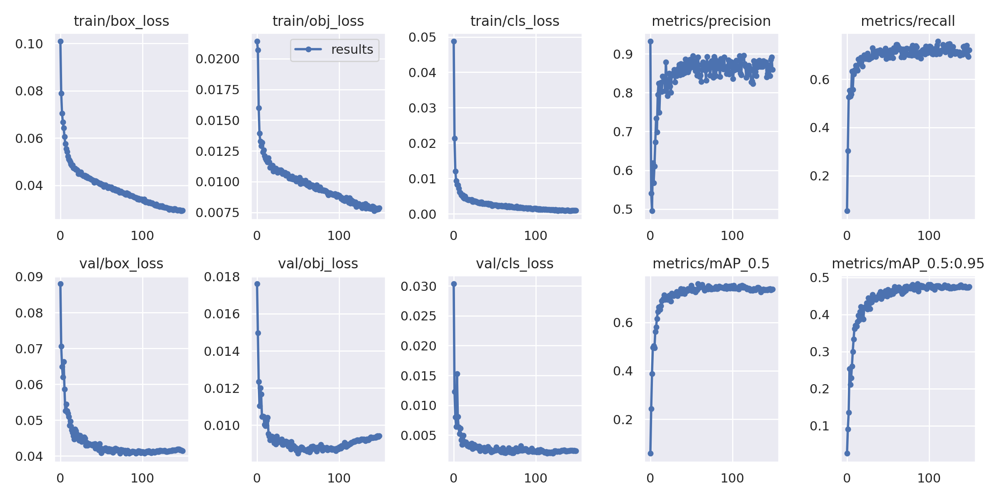

In [22]:
# can also output graphs
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


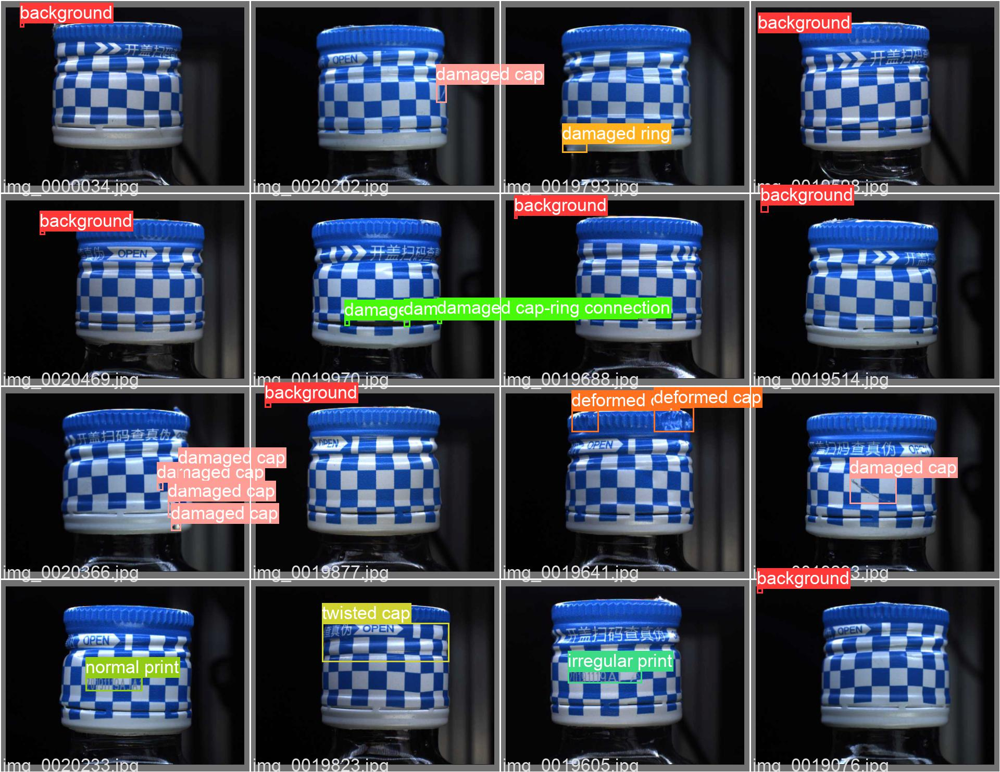

In [23]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

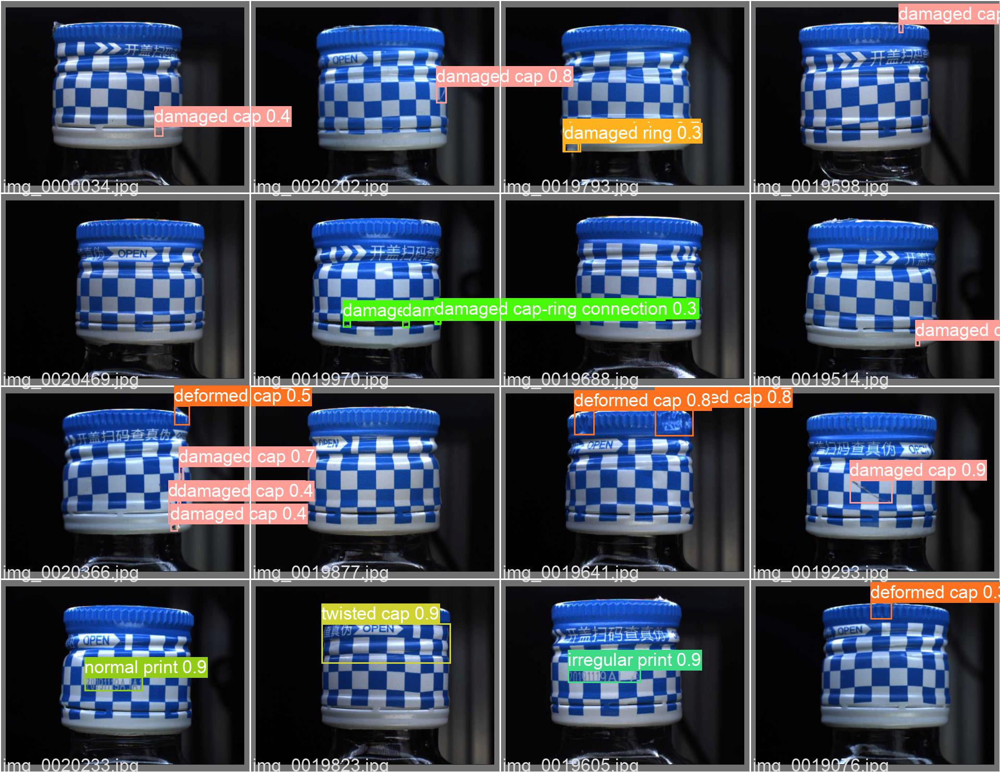

In [24]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_pred.jpg', width=900)

GROUND TRUTH TRAINING DATA:


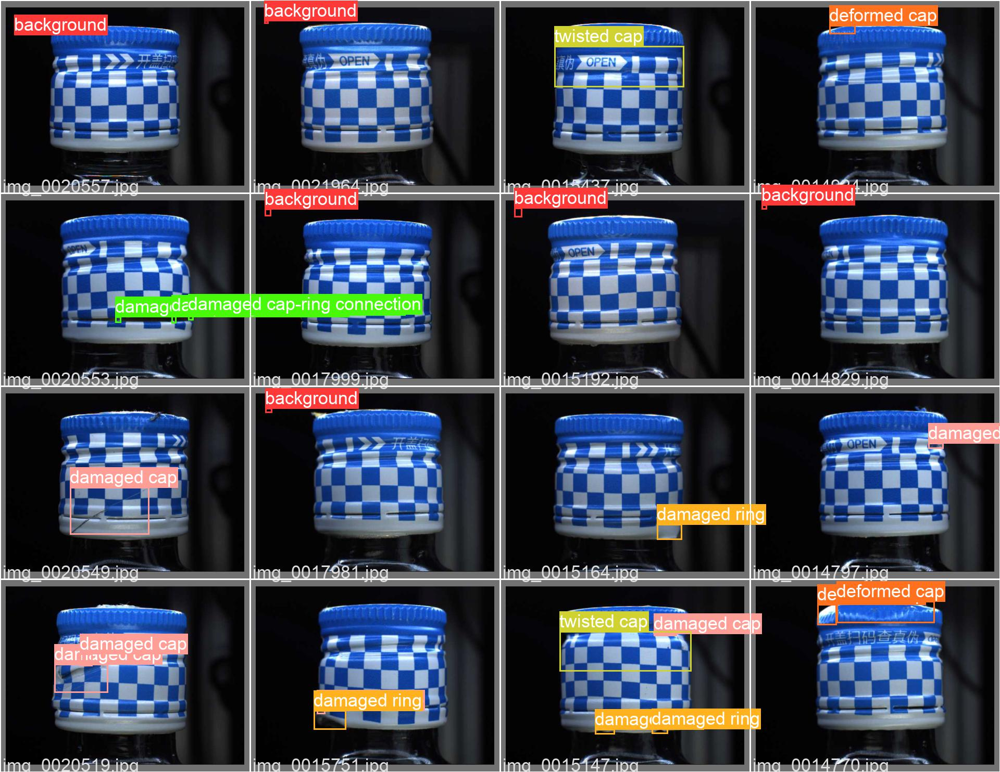

In [25]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_labels.jpg', width=900)

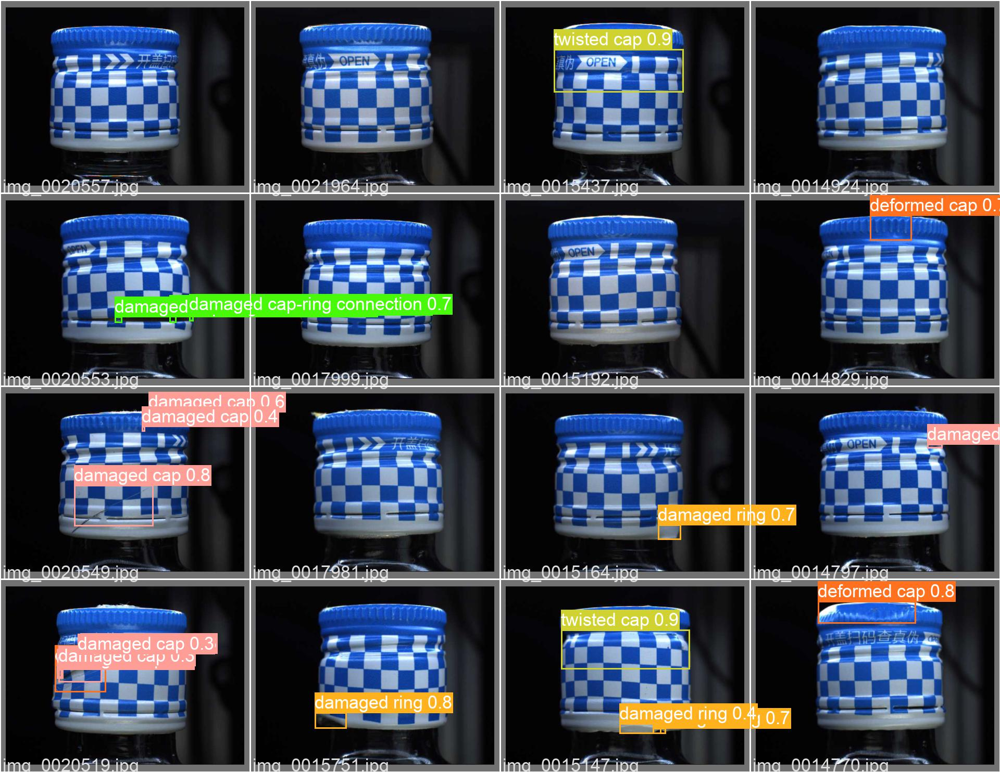

In [26]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_pred.jpg', width=900)

GROUND TRUTH TRAINING DATA:


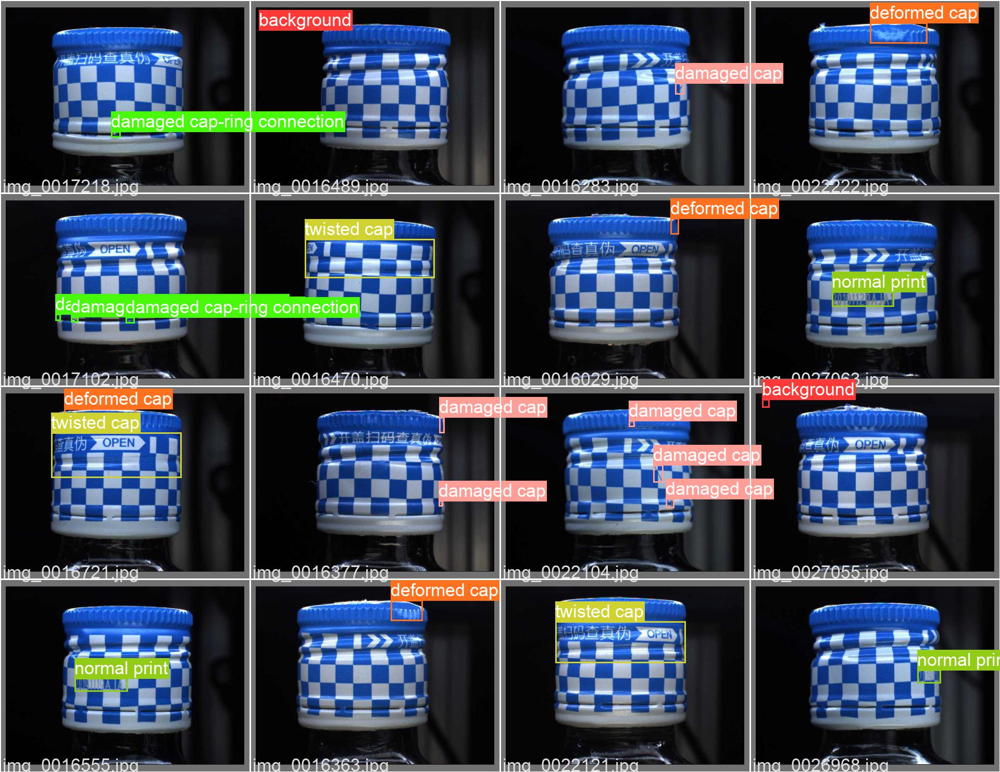

In [27]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch2_labels.jpg', width=900)

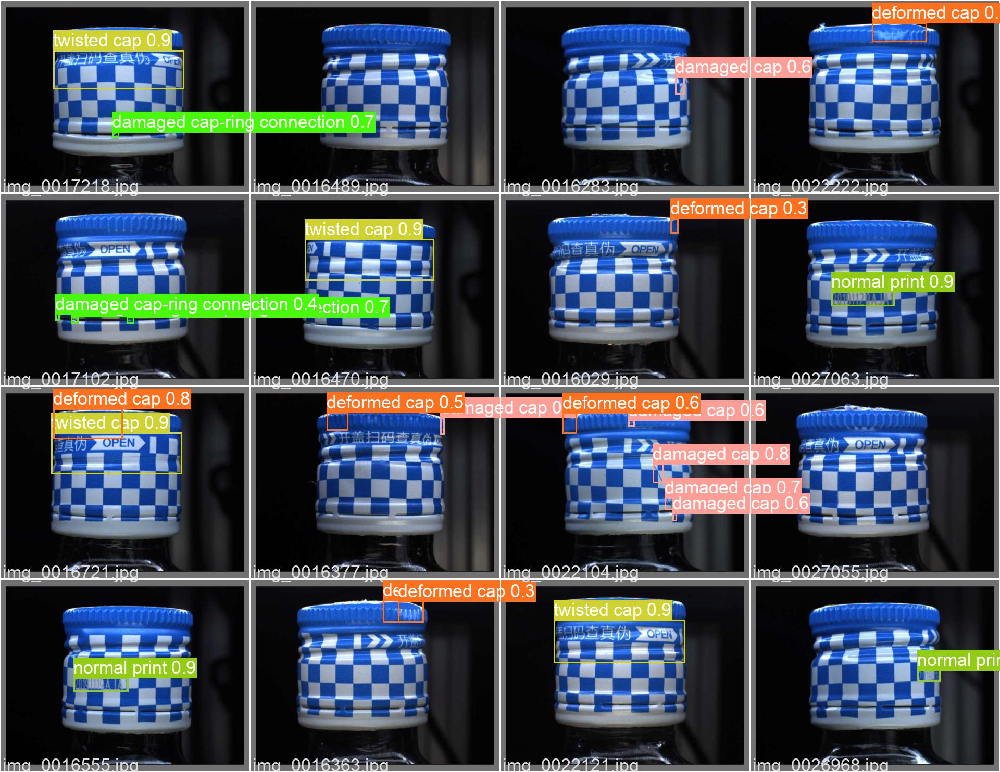

In [28]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch2_pred.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


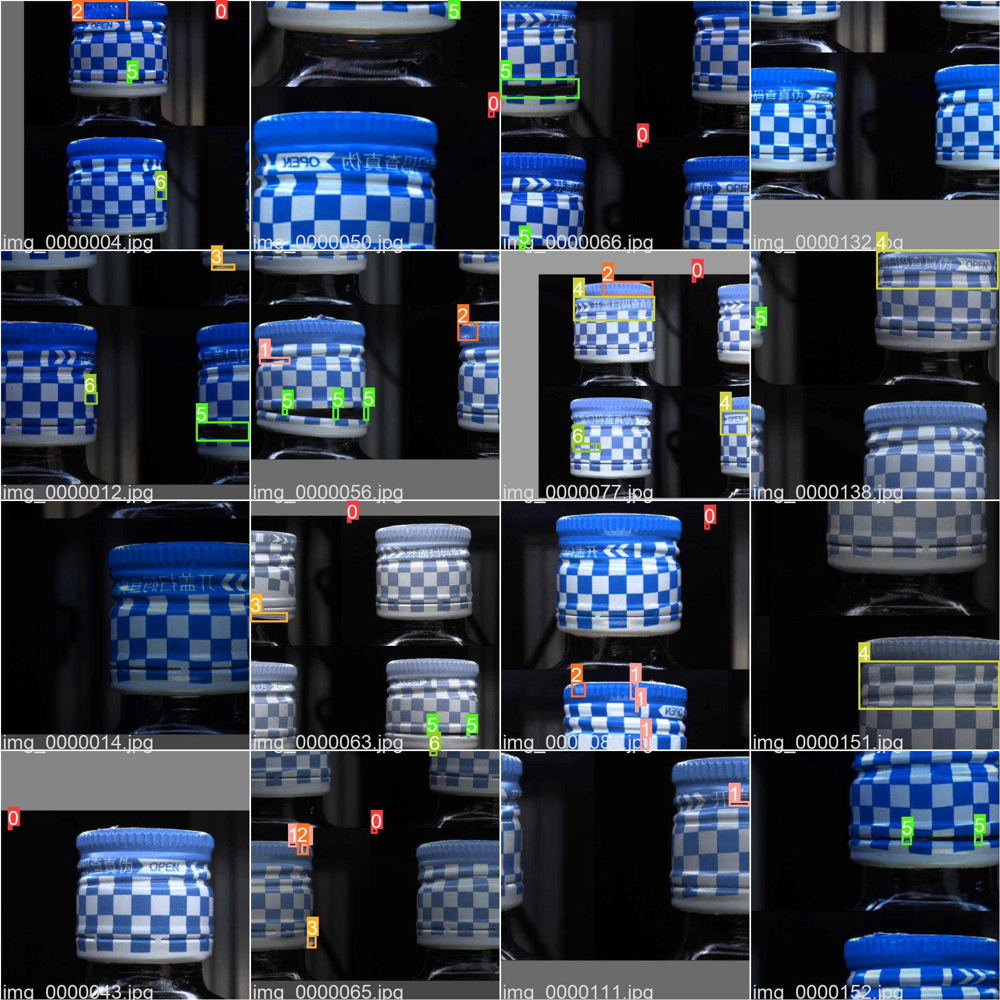

In [29]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

# Run Inference with Trained Weights

In [30]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [34]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 658 --conf 0.3 --source ./dataset/images/test

/content
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=./dataset/images/test, imgsz=[658, 658], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-40-g8c326a1 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
Model Summary: 213 layers, 7031701 parameters, 0 gradients, 15.9 GFLOPs
image 1/42 /content/yolov5/dataset/images/test/img_0000109.jpg: 512x672 1 normal print, Done. (0.010s)
image 2/42 /content/yolov5/dataset/images/test/img_0000733.jpg: 512x672 1 twisted cap, Done. (0.006s)
image 3/42 /content/yolov5/dataset/images/test/img_0000745.jpg: 512x672 4 damaged caps, Done. (0.006s)
image 4/42 /content/yolov5/dataset/images/test/img_0001

/content/yolov5/runs/detect/exp4/img_0017280.jpg


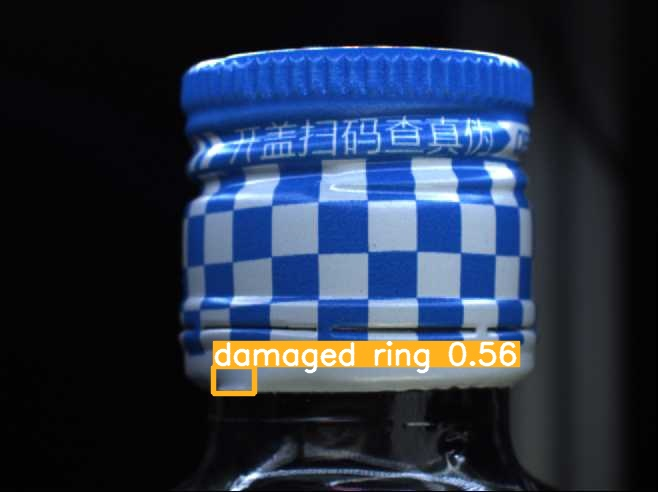



/content/yolov5/runs/detect/exp4/img_0005591.jpg


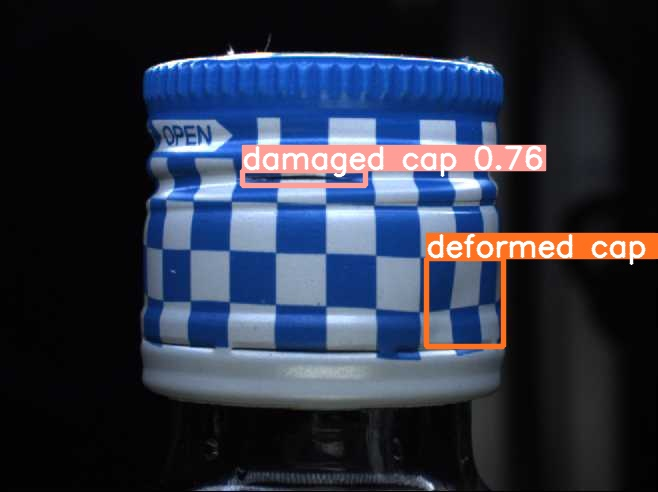



/content/yolov5/runs/detect/exp4/img_0020407.jpg


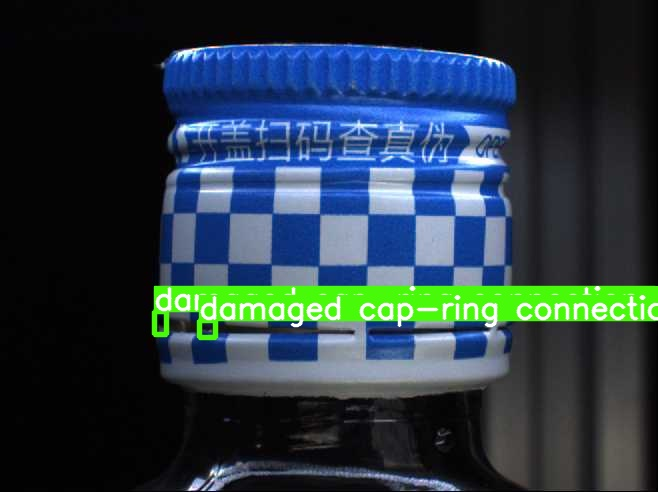



/content/yolov5/runs/detect/exp4/img_0002841.jpg


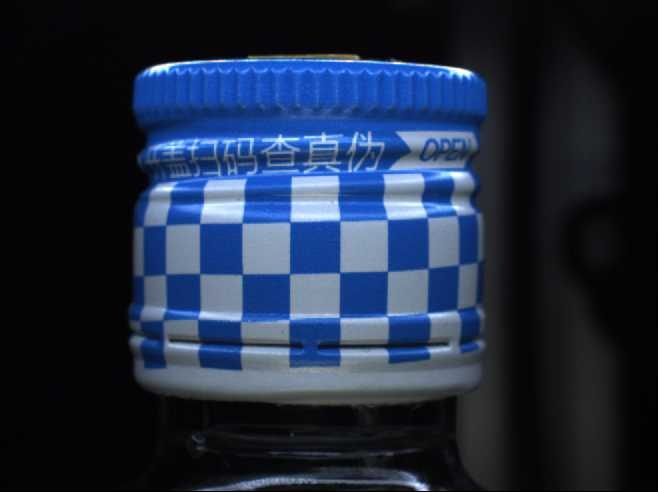



/content/yolov5/runs/detect/exp4/img_0010076.jpg


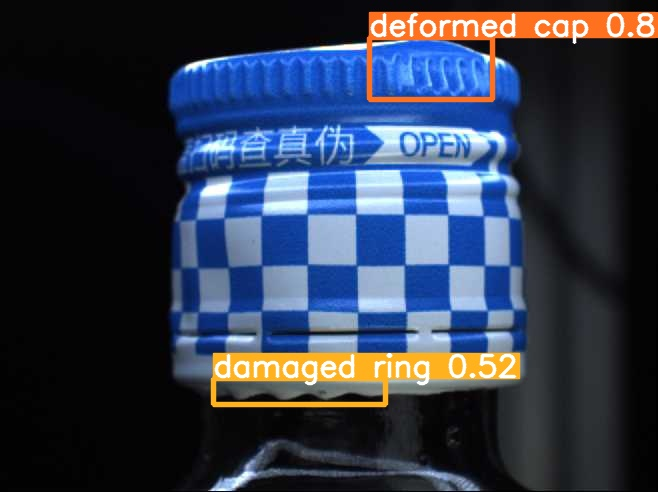



/content/yolov5/runs/detect/exp4/img_0024137.jpg


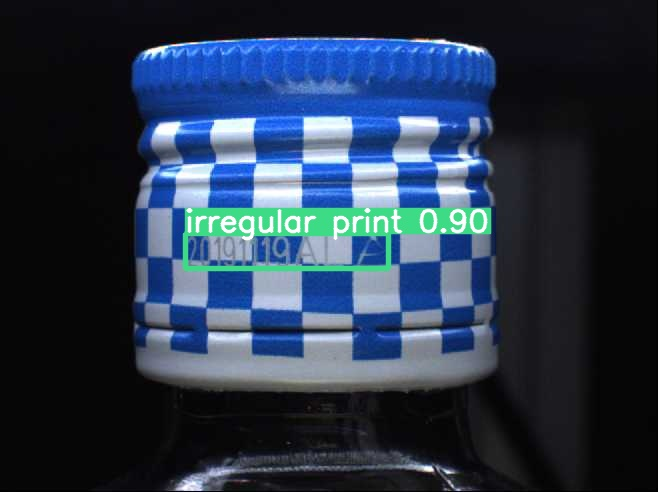



/content/yolov5/runs/detect/exp4/img_0029759.jpg


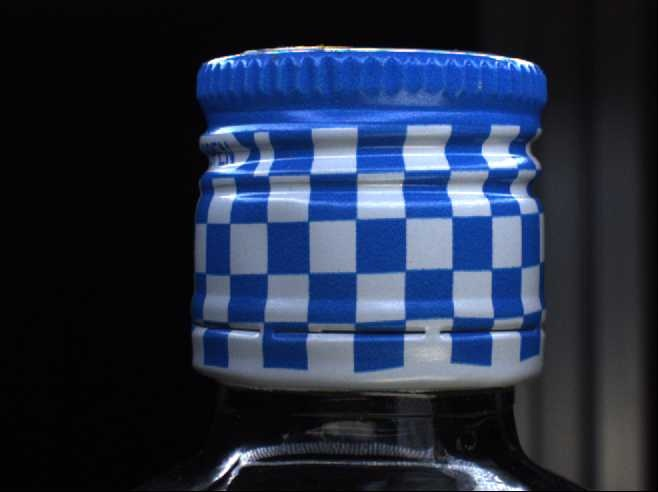



/content/yolov5/runs/detect/exp4/img_0013539.jpg


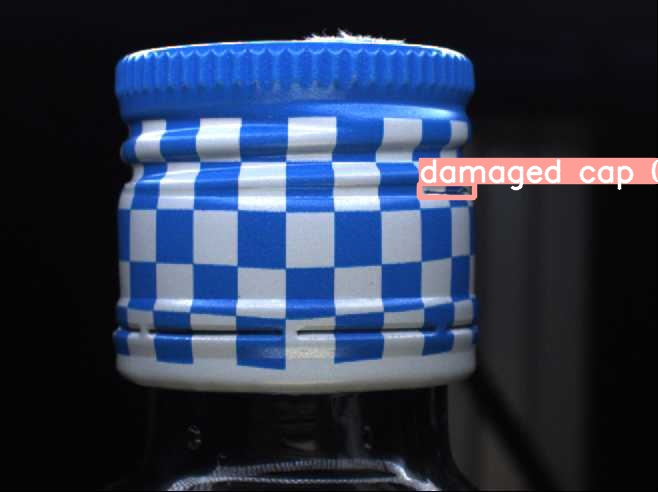



/content/yolov5/runs/detect/exp4/img_0004376.jpg


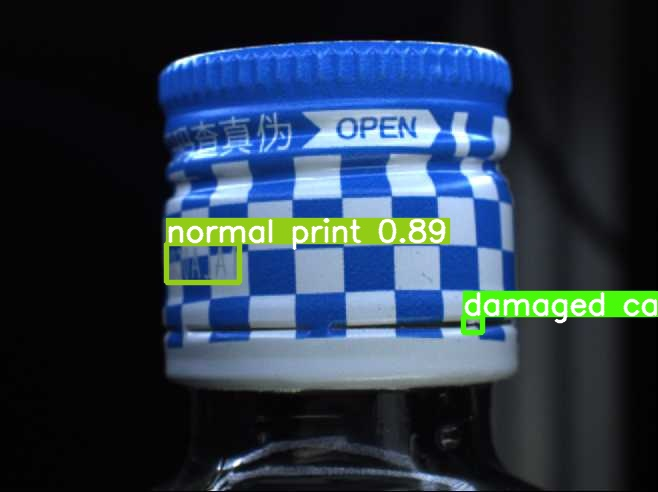



/content/yolov5/runs/detect/exp4/img_0023155.jpg


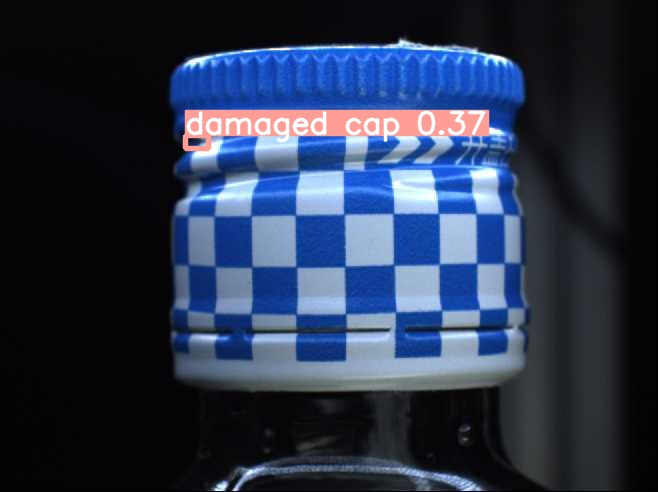



/content/yolov5/runs/detect/exp4/img_0022782.jpg


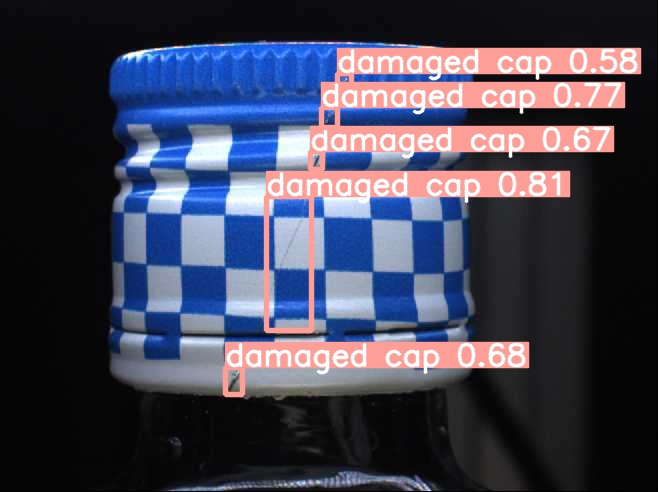



/content/yolov5/runs/detect/exp4/img_0017243.jpg


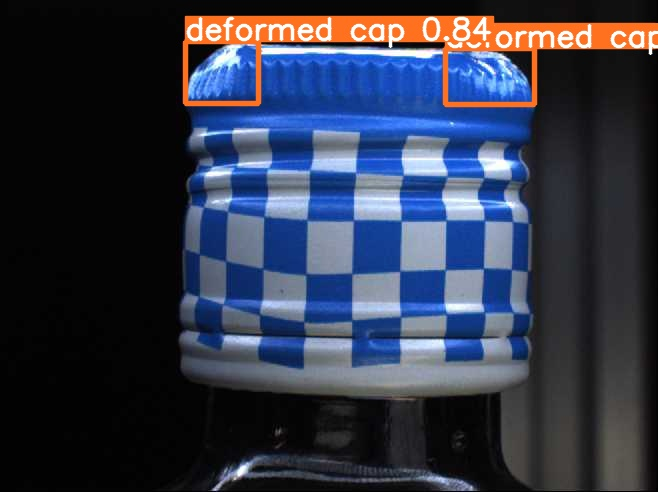



/content/yolov5/runs/detect/exp4/img_0013807.jpg


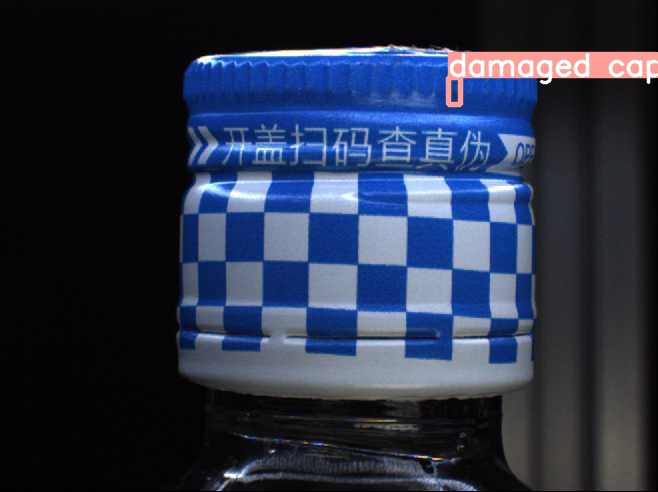



/content/yolov5/runs/detect/exp4/img_0019558.jpg


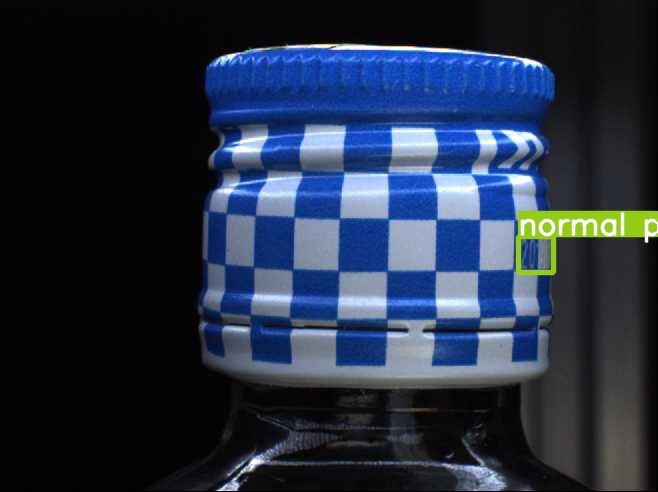



/content/yolov5/runs/detect/exp4/img_0014988.jpg


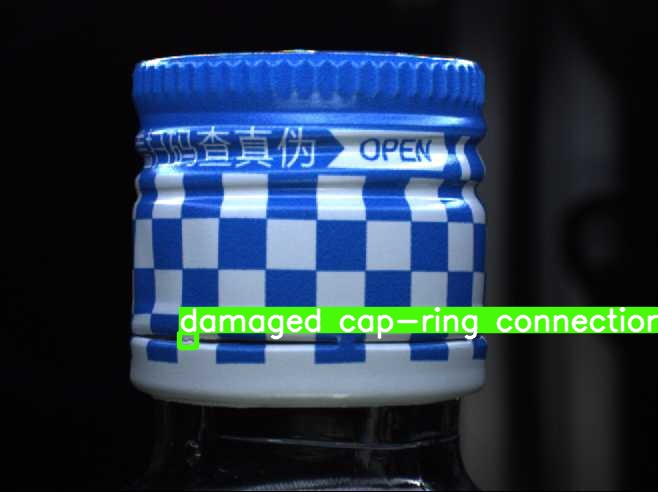



/content/yolov5/runs/detect/exp4/img_0003919.jpg


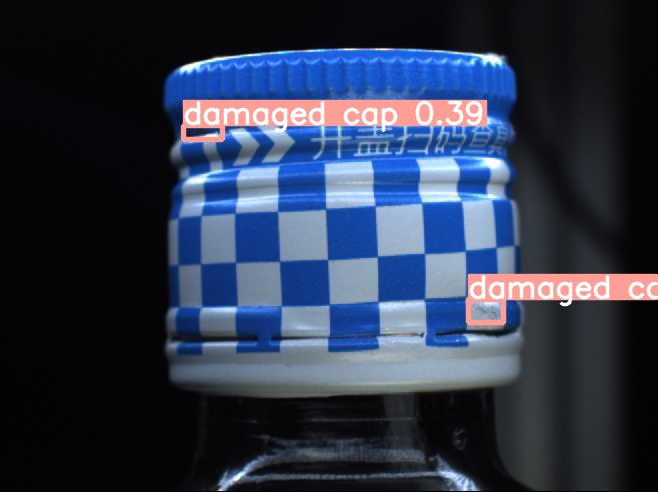



/content/yolov5/runs/detect/exp4/img_0002627.jpg


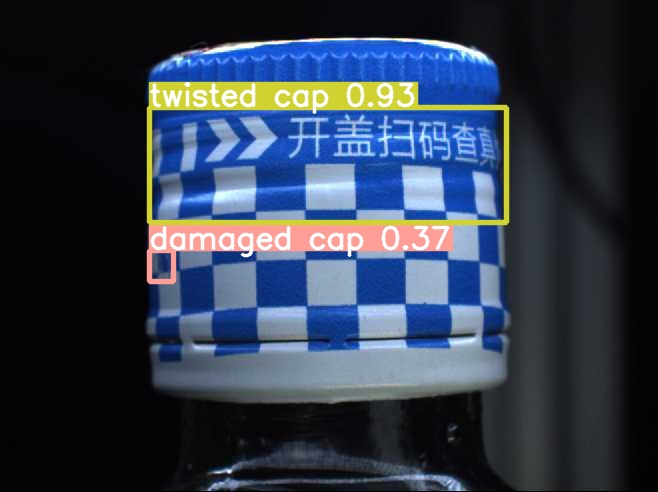



/content/yolov5/runs/detect/exp4/img_0019410.jpg


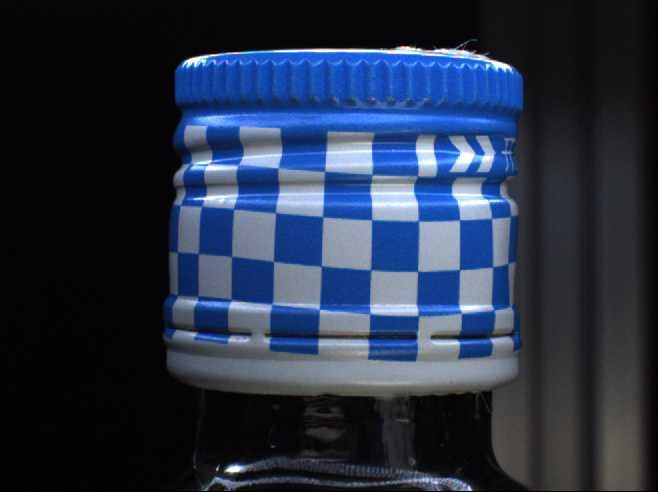



/content/yolov5/runs/detect/exp4/img_0015011.jpg


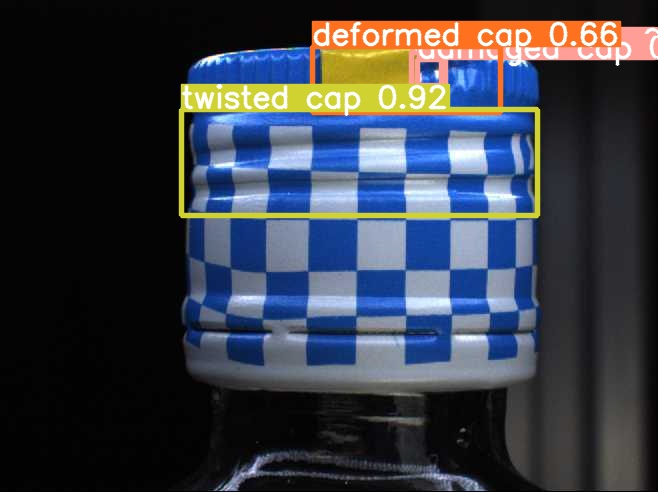



/content/yolov5/runs/detect/exp4/img_0003472.jpg


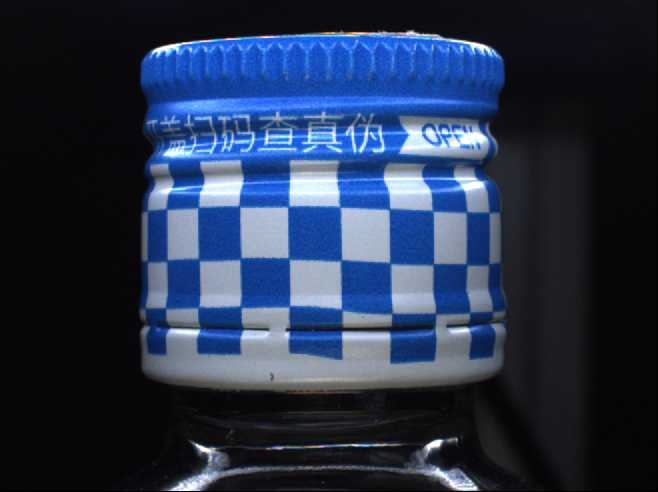



/content/yolov5/runs/detect/exp4/img_0024293.jpg


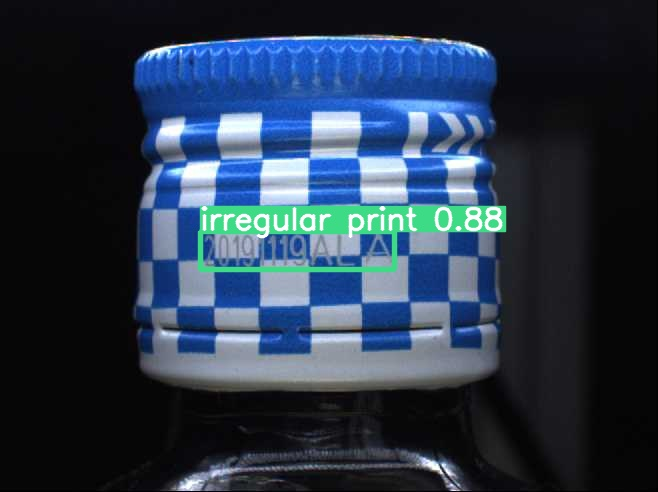



/content/yolov5/runs/detect/exp4/img_0007505.jpg


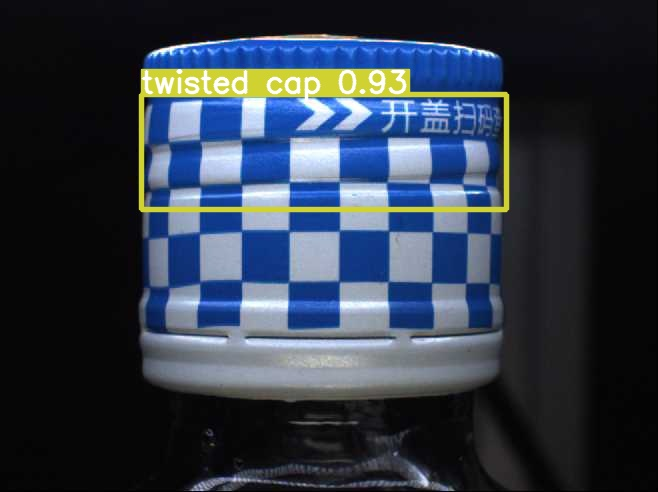



/content/yolov5/runs/detect/exp4/img_0001895.jpg


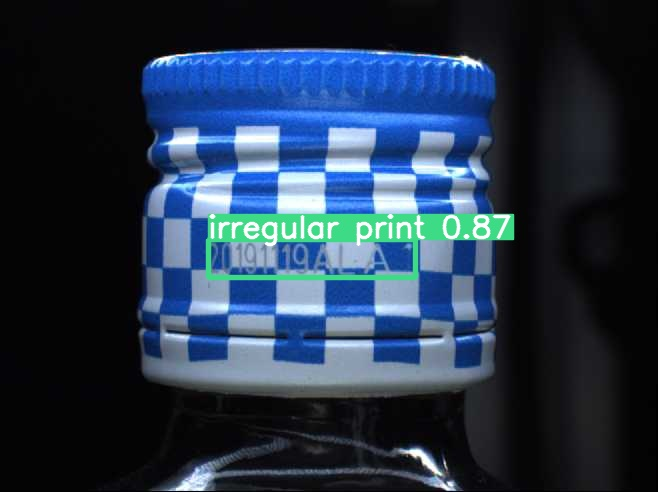



/content/yolov5/runs/detect/exp4/img_0020196.jpg


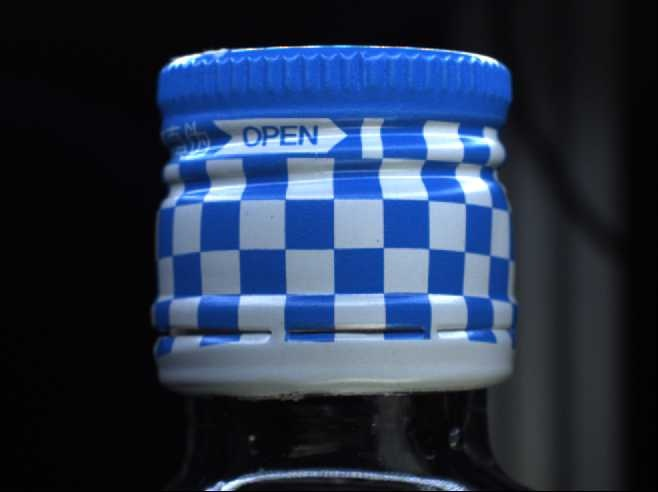



/content/yolov5/runs/detect/exp4/img_0011136.jpg


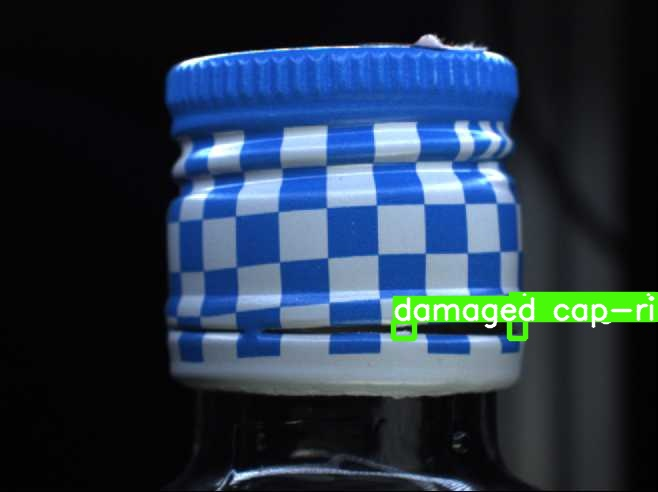



/content/yolov5/runs/detect/exp4/img_0014041.jpg


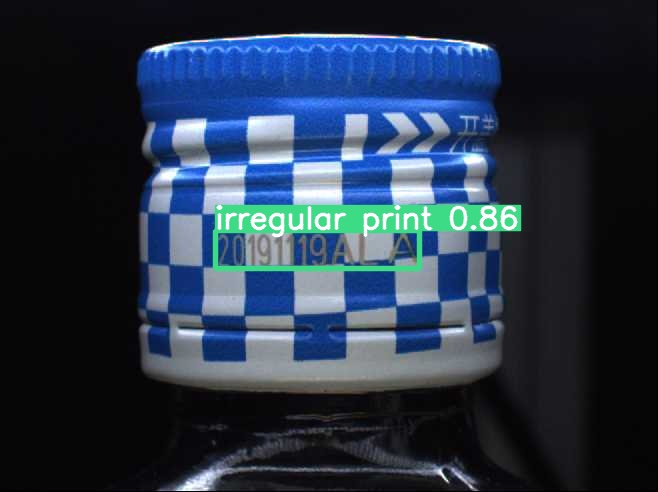



/content/yolov5/runs/detect/exp4/img_0006941.jpg


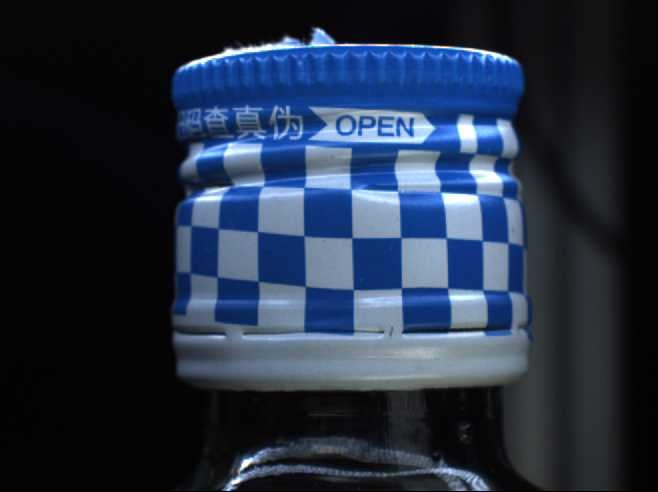



/content/yolov5/runs/detect/exp4/img_0016549.jpg


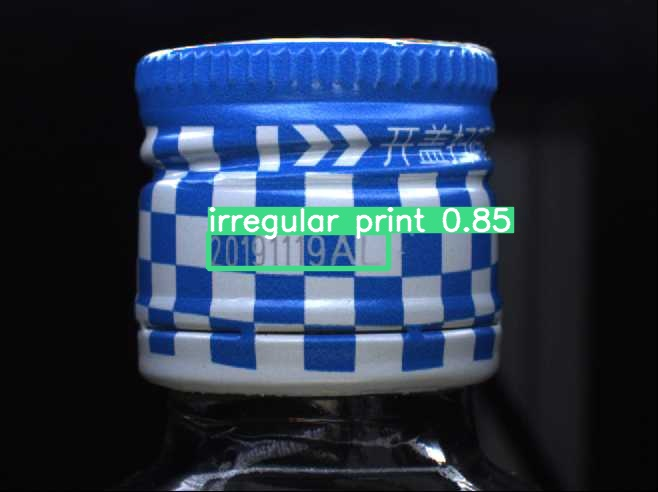



/content/yolov5/runs/detect/exp4/img_0008529.jpg


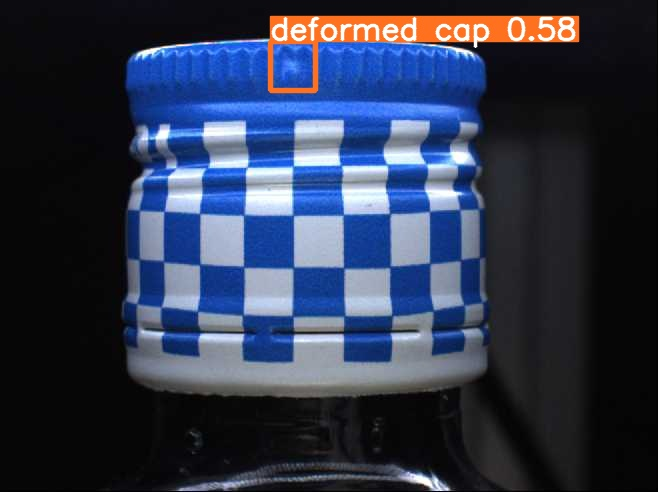



/content/yolov5/runs/detect/exp4/img_0022816.jpg


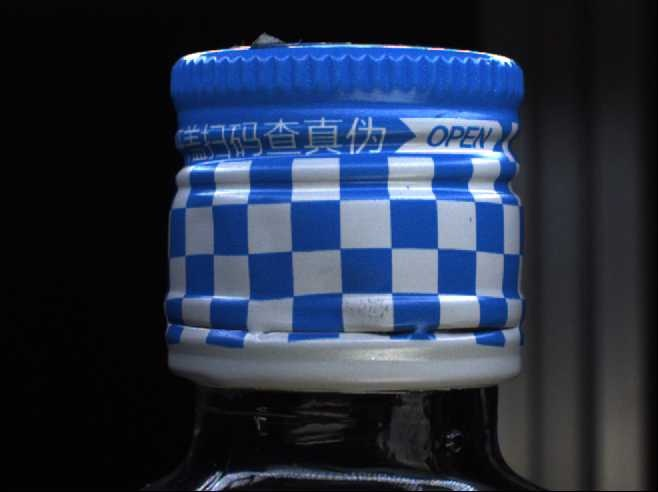



/content/yolov5/runs/detect/exp4/img_0015663.jpg


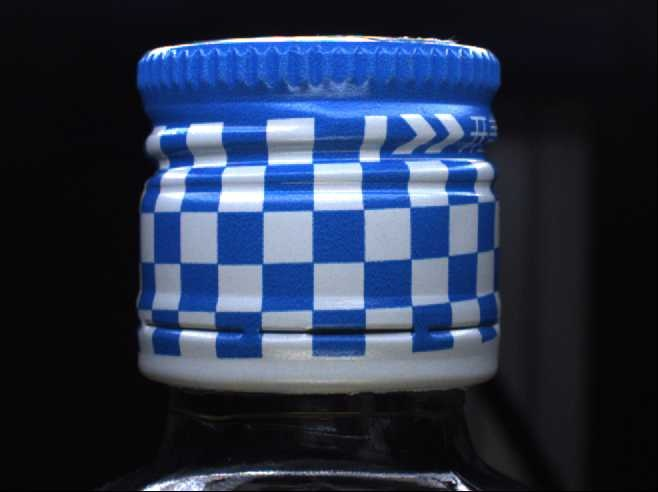



/content/yolov5/runs/detect/exp4/img_0027309.jpg


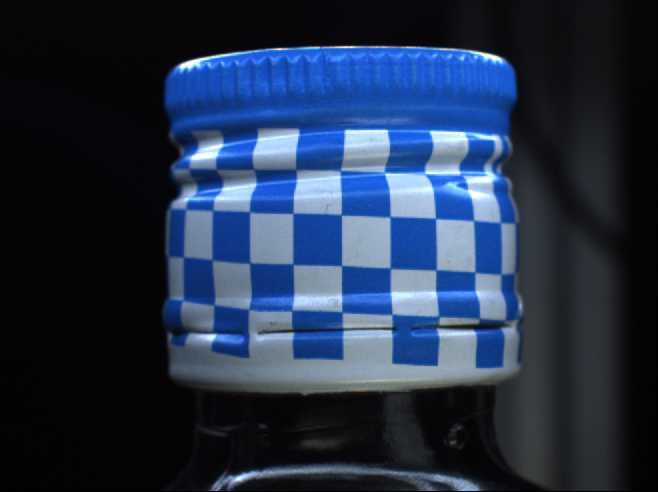



/content/yolov5/runs/detect/exp4/img_0001054.jpg


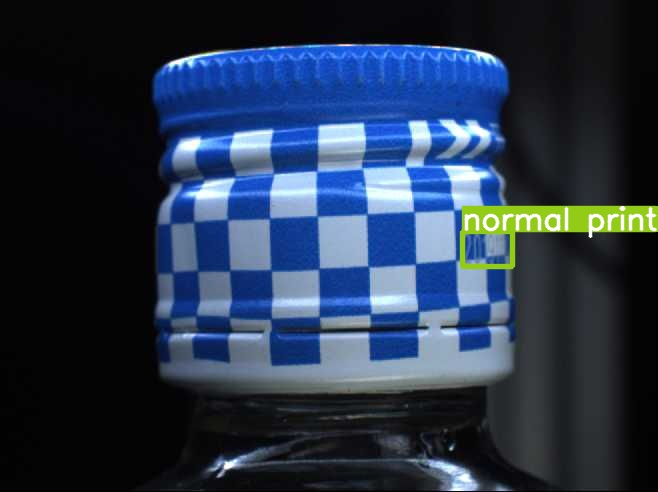



/content/yolov5/runs/detect/exp4/img_0000733.jpg


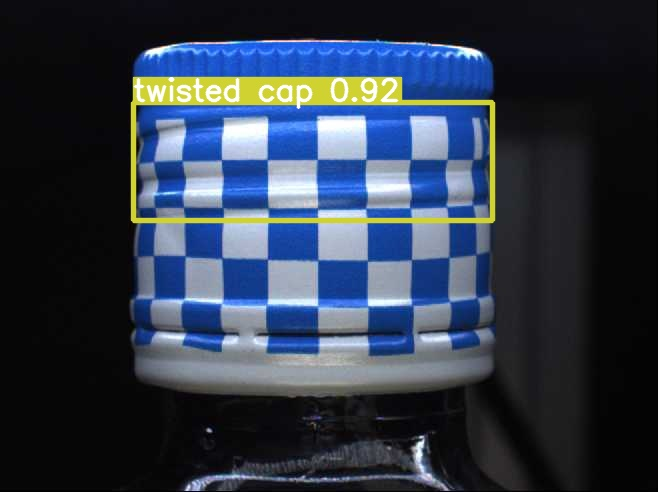



/content/yolov5/runs/detect/exp4/img_0018957.jpg


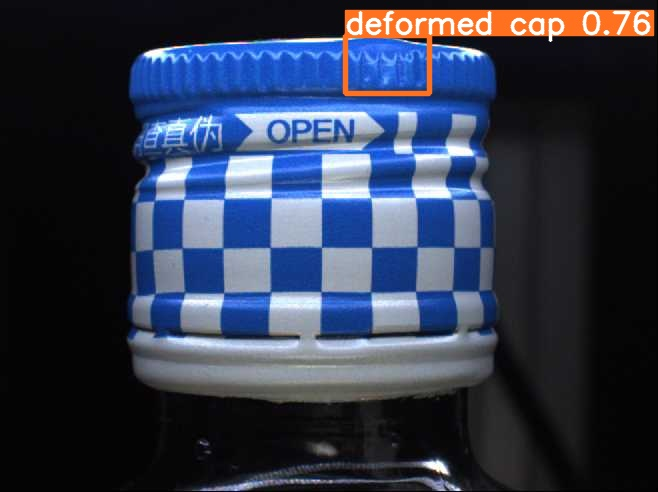



/content/yolov5/runs/detect/exp4/img_0024621.jpg


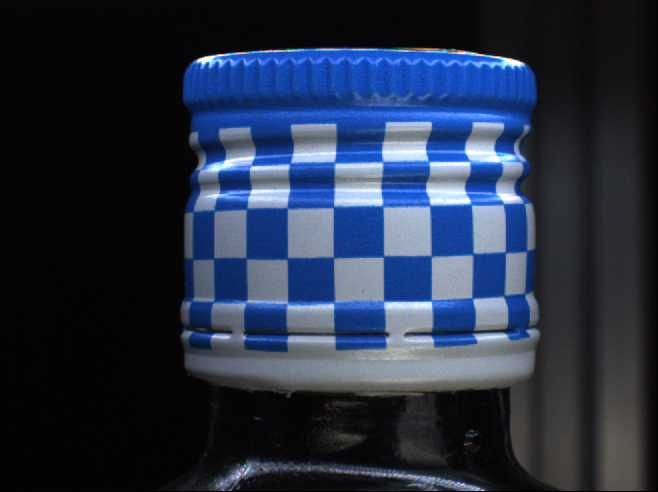



/content/yolov5/runs/detect/exp4/img_0000745.jpg


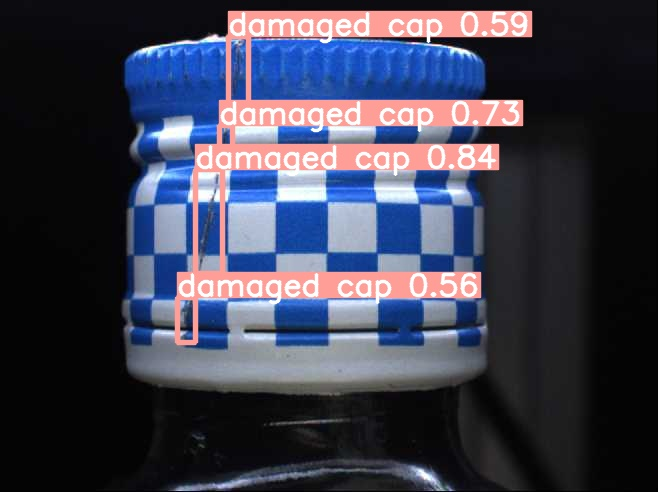



/content/yolov5/runs/detect/exp4/img_0021866.jpg


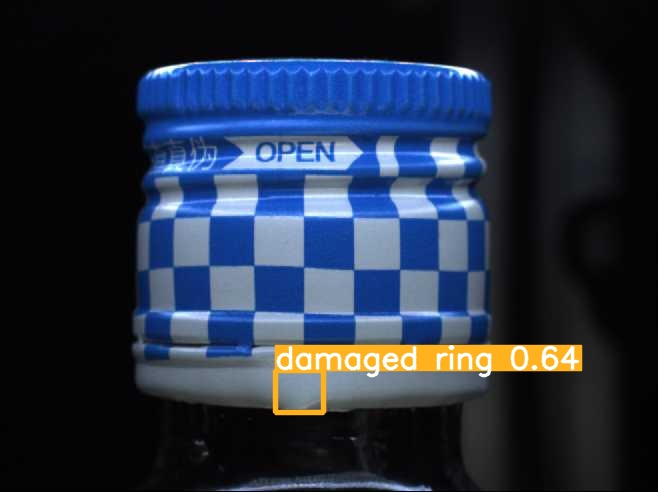



/content/yolov5/runs/detect/exp4/img_0008898.jpg


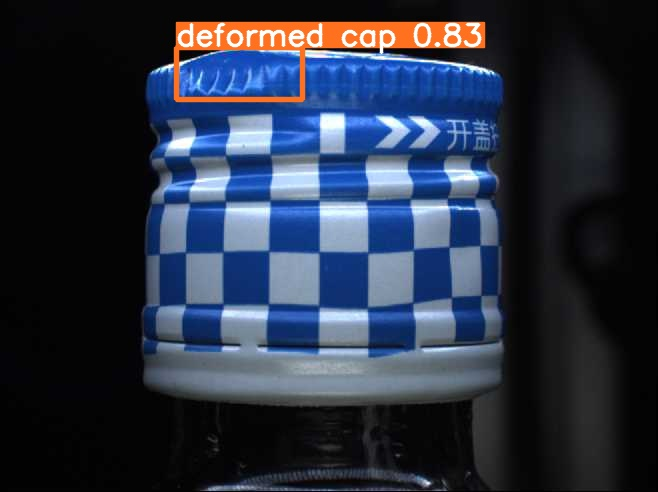



/content/yolov5/runs/detect/exp4/img_0011566.jpg


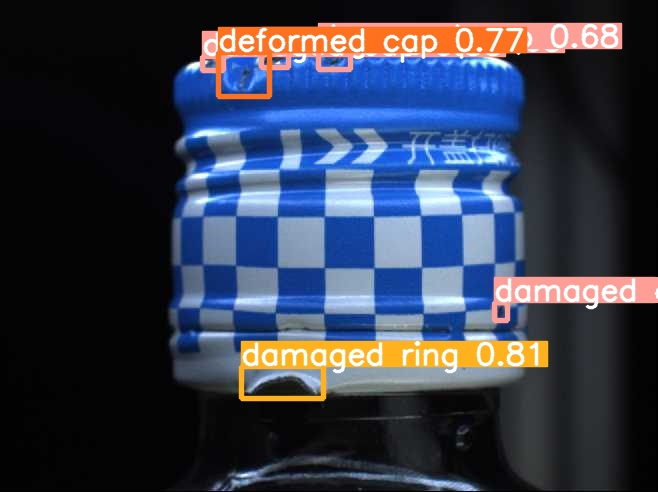



/content/yolov5/runs/detect/exp4/img_0024553.jpg


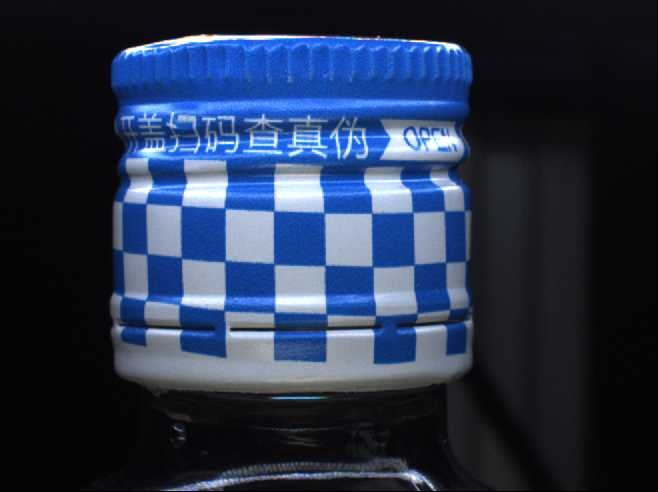



/content/yolov5/runs/detect/exp4/img_0000109.jpg


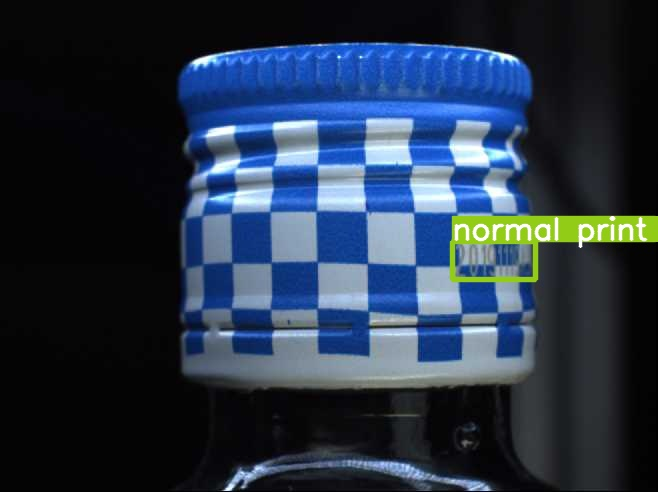

In [35]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    print(imageName)
    display(Image(filename=imageName))
    print("\n")

In [ ]:
def draw_bbox(image, xmin, ymin, w, h, text=None):
    
    """
    This functions draws one bounding box on an image.
    
    Input: Image (numpy array)
    Output: Image with the bounding box drawn in. (numpy array)
    
    If there are multiple bounding boxes to draw then simply
    run this function multiple times on the same image.
    
    Set text=None to only draw a bbox without
    any text or text background.
    E.g. set text='Balloon' to write a title above the bbox.
    
    xmin, ymin --> coords of the top left corner.
    w, h --> width and height of bounding boxes.
    
    """

    xmax = xmin + w
    ymax = ymin + h

    # Draw the bounding box
    start_point = (xmin, ymin) 
    end_point = (xmax, ymax) 
    bbox_color = (255, 0, 0) 
    bbox_thickness = 5

    image = cv2.rectangle(image, start_point, end_point, bbox_color, bbox_thickness) 
    
    # Only do this if text is not None.
    if text:
        # Draw the background behind the text
        text_bground_color = (0,0,0) # black
        cv2.rectangle(image, (xmin, ymin-50), (xmin+w, ymin), text_bground_color, -1)

        # Draw the text
        text_color = (255, 255, 255) # white
        font = cv2.FONT_HERSHEY_DUPLEX
        origin = (xmin, ymin-10)
        fontScale = 1
        thickness = 1

        image = cv2.putText(image, text, origin, font, fontScale, text_color, thickness, cv2.LINE_AA)

    return image

img_0013593.jpg
[0]
uint8
0
255
(492, 658, 3)


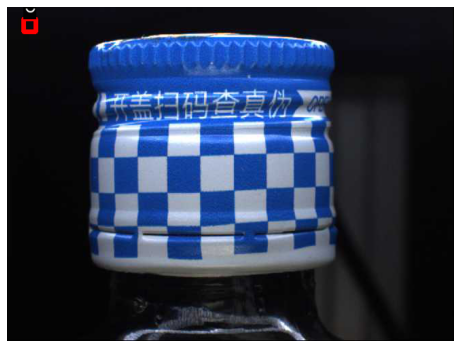

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
# set the figsize so the image is larger
plt.figure(figsize=(8,8))

# Choose an index.
# Change this number to see different images.
i = 1405

# Load an image
fname = df_data.loc[i, 'file_name']
print(fname)
path = base_path + 'images/' + fname
image = plt.imread(path)

bbox_list = df_data.loc[i, 'bbox']
categories = df_data.loc[i, 'categories']
print(categories)

# Draw the bboxes on the image
for j in range(len(categories)):
    category = categories[j]
    xmin = int(bbox_list[j][0])
    ymin = int(bbox_list[j][1])
    w = int(bbox_list[j][2])
    h = int(bbox_list[j][3])
    image = draw_bbox(image, xmin, ymin, w, h, text=str(category))

print(image.dtype)
print(image.min())
print(image.max())
print(image.shape)

plt.imshow(image)
plt.axis('off')
plt.show()

In [36]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive/traning_0111

In [37]:
%cp -r /content/yolov5/runs /content/gdrive/My\ Drive/training_0111